In [5]:
##Import necessary tools
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np
from matplotlib import reload
from math import radians, cos, sin, asin, sqrt
from salishsea_tools import (
    nc_tools,
    viz_tools,
    geo_tools,
    tidetools,
    visualisations,
)
import sys
import os
#import glob
#import xarray as xr
#from xarray import Dataset as ds
#import time


#import cmocean
sys.path.append('/data/tjarniko/MEOPAR/at3/notebooks/CLUSTER/verze2pt0/hind_clfxn/maps_signals')
import cluster_fxn as cf
# sys.path.append(respath)
%matplotlib inline
import scipy.io as sio
bath = '/results/nowcast-sys/NEMO-forcing/grid/mesh_mask_SalishSea2.nc'
#grid = mf.import_bathy(bath)
#fmask = (grid.fmask[0,0,:,:])
from IPython.display import Image

In [6]:
## Load data and pick cluster number


{'__header__': b'MATLAB 5.0 MAT-file, Platform: MACI64, Created on: Mon Oct  7 08:59:49 2019', '__version__': '1.0', '__globals__': [], 'cl_n': array([[100]], dtype=uint8), 'clustermap': array([[ 90],
       [ 90],
       [ 90],
       [ 90],
       [ 51],
       [ 51],
       [ 51],
       [ 51],
       [ 90],
       [ 90],
       [ 90],
       [ 51],
       [ 51],
       [ 51],
       [ 51],
       [ 90],
       [ 90],
       [ 90],
       [ 51],
       [ 51],
       [ 51],
       [ 90],
       [ 90],
       [ 90],
       [ 51],
       [ 51],
       [  3],
       [ 51],
       [ 90],
       [ 90],
       [ 51],
       [ 51],
       [  3],
       [  3],
       [ 51],
       [ 90],
       [ 25],
       [  3],
       [  3],
       [  3],
       [  3],
       [ 19],
       [ 90],
       [ 90],
       [ 25],
       [  3],
       [  3],
       [  3],
       [  3],
       [ 19],
       [ 90],
       [ 90],
       [ 25],
       [ 25],
       [  3],
       [  3],
       [  3],
       [ 90],
 

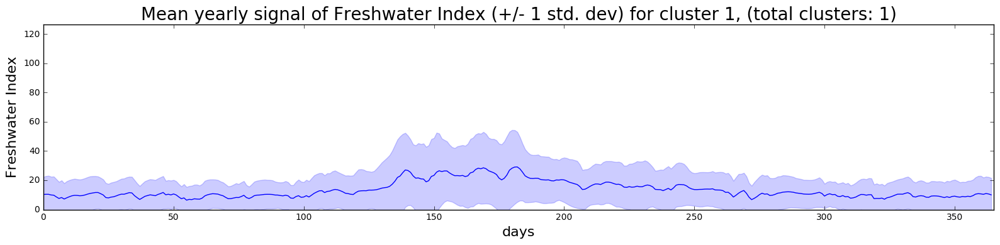

2
2
15


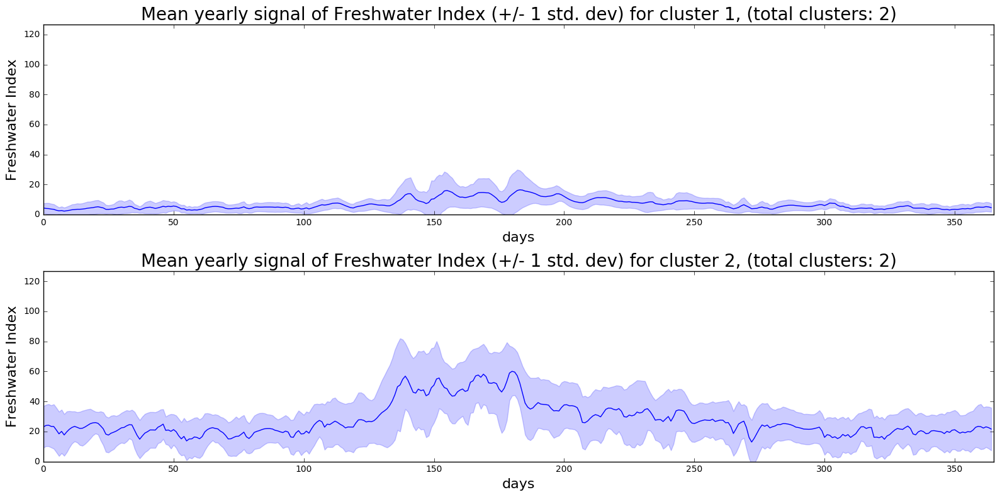

3
3
15


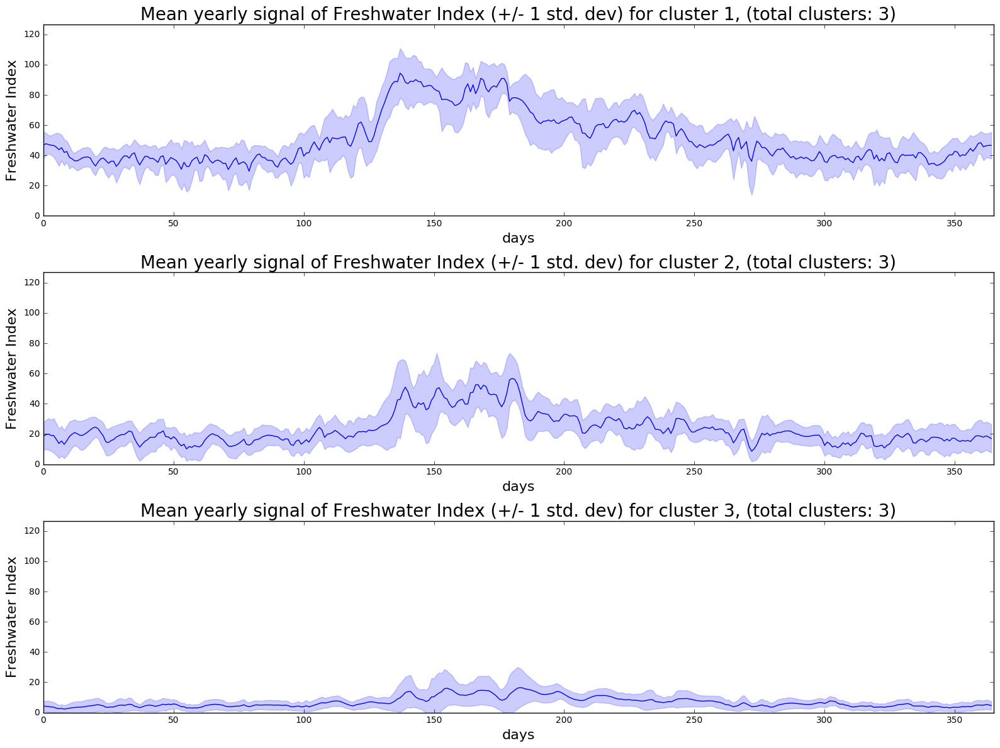

4
4
15


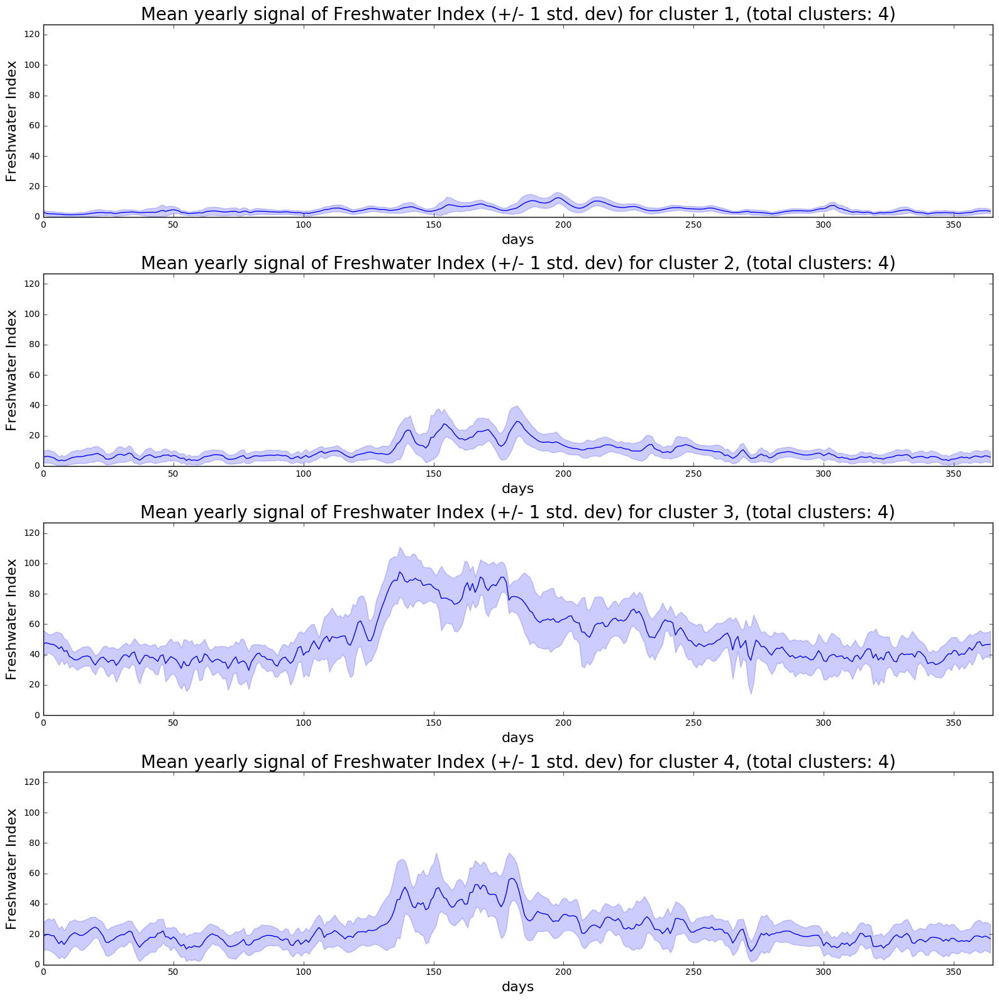

5
5
15


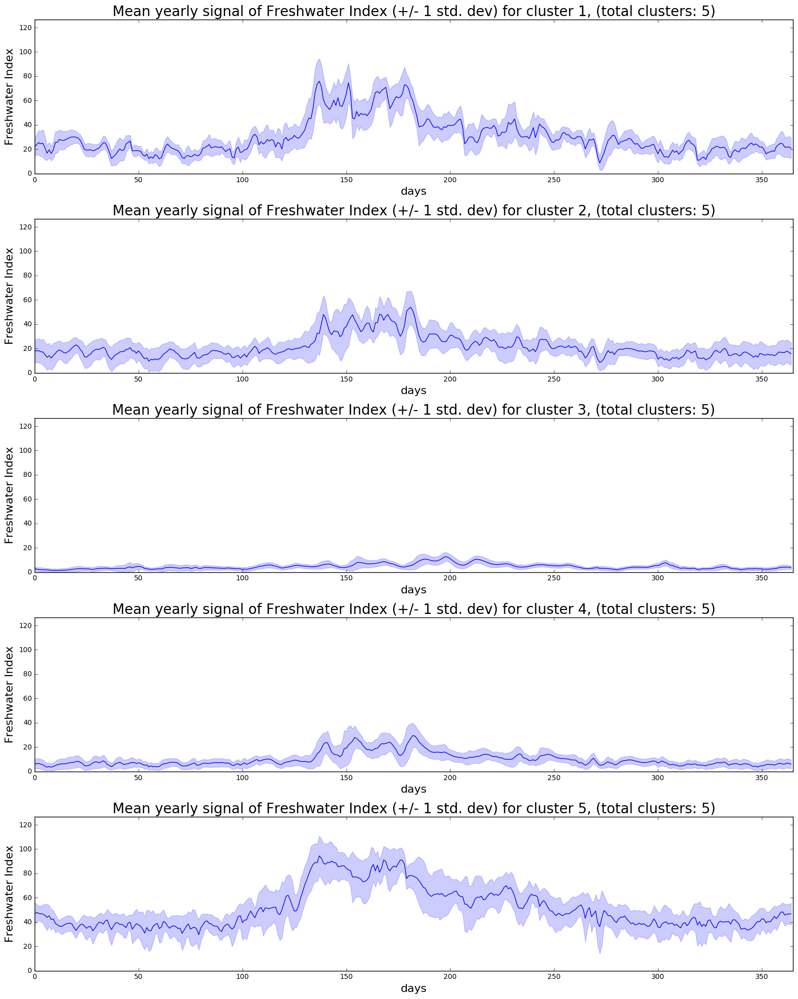

6
6
15


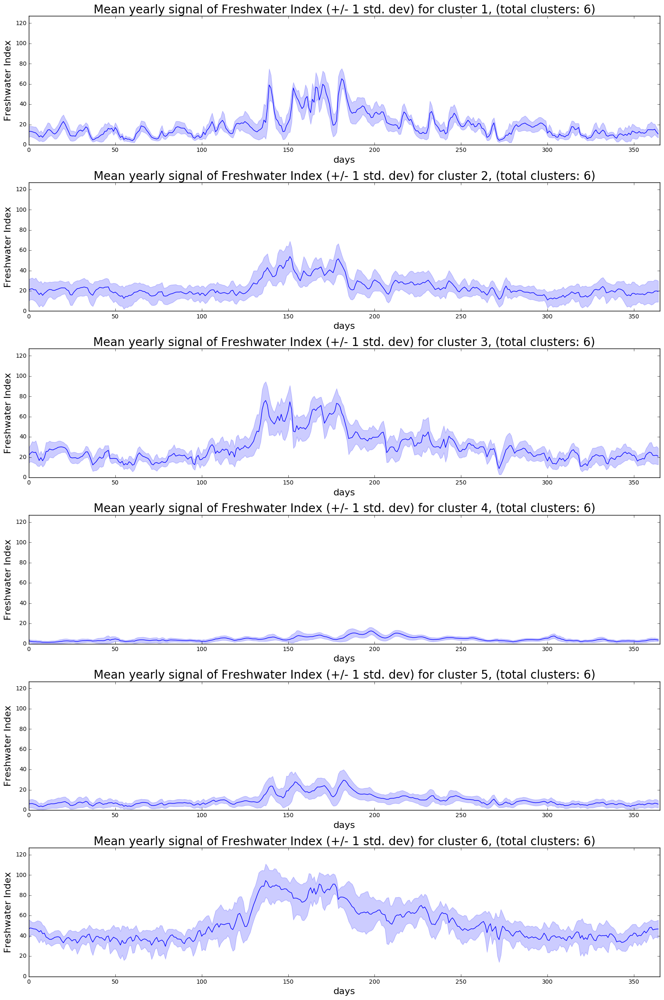

7
7
15


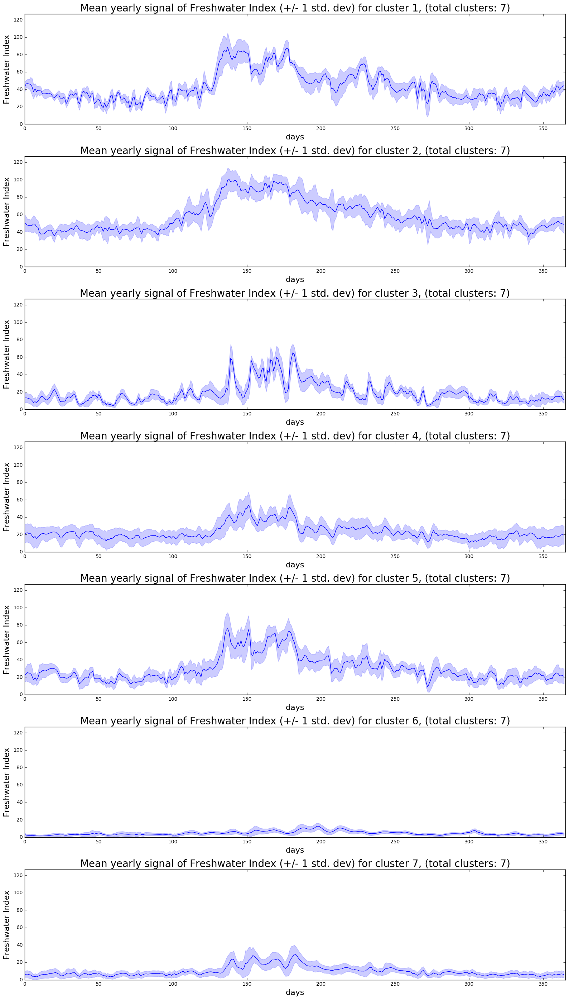

8
8
15


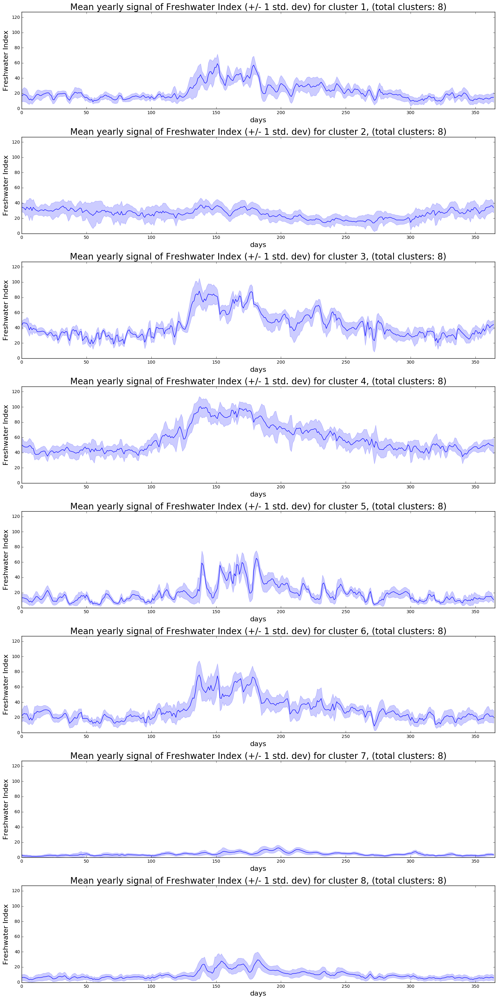

9
9
15


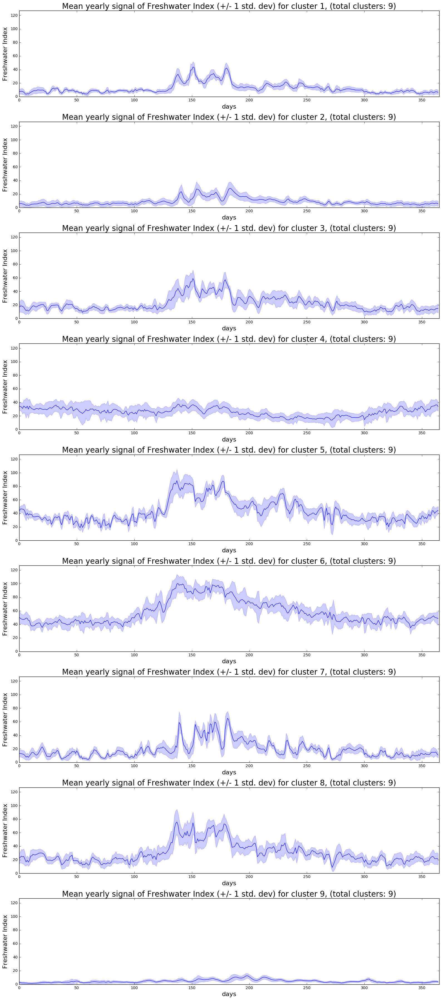

10
10
15


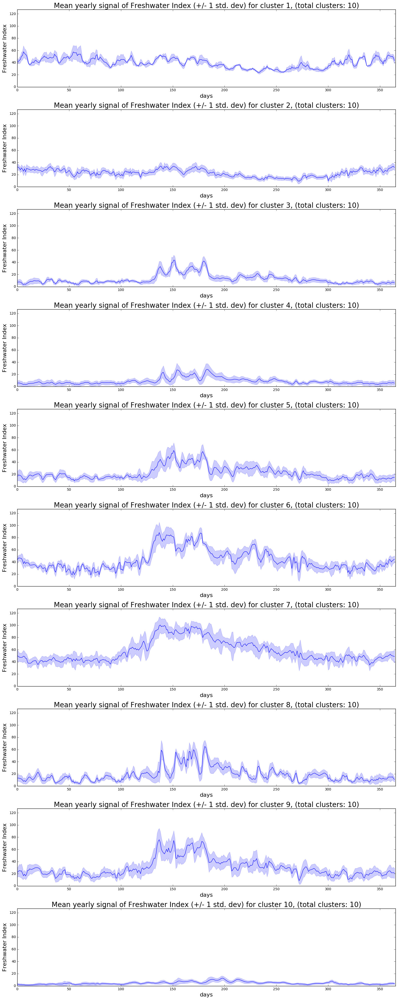

11
11
15


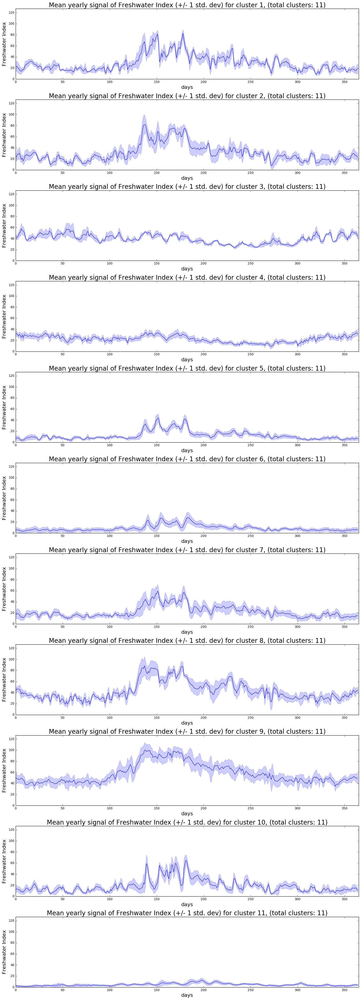

12
12
15


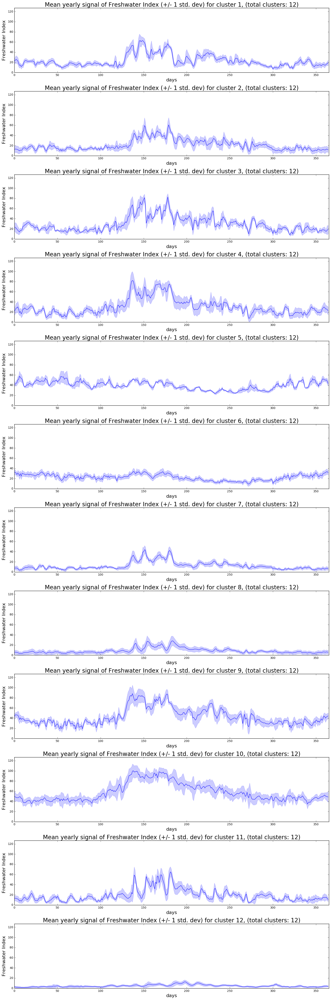

13
13
15


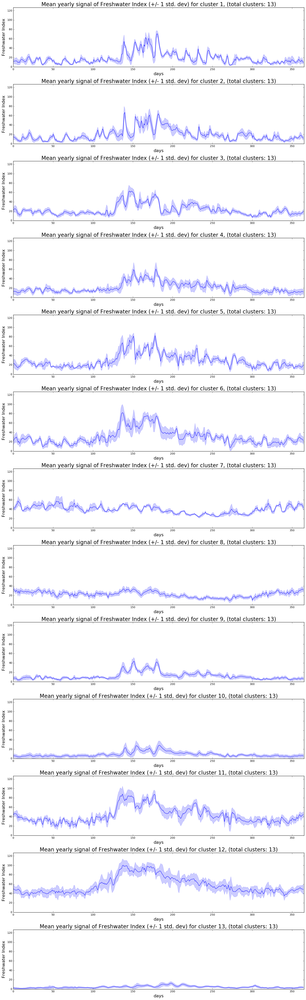

14
14
15


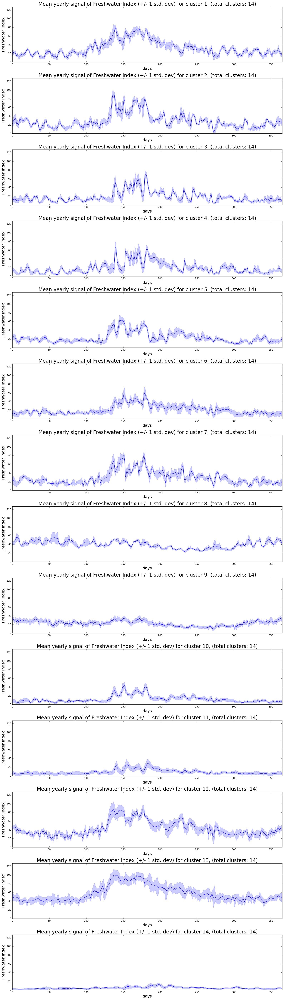

15
15
15


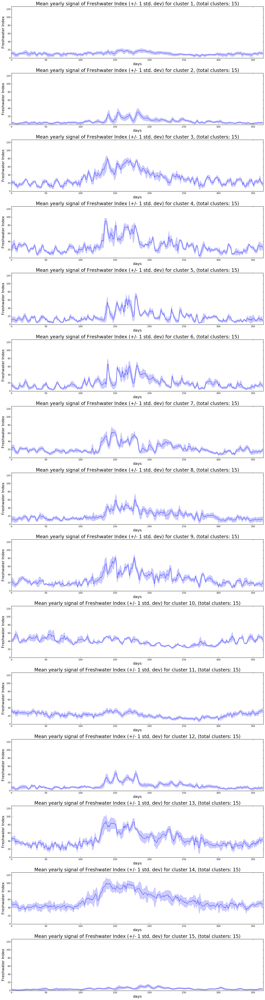

In [7]:
no_cl = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]

noday = 365
var = 'fwi'
year = '2013'
fname = './datamats/' + var + '_' + year + 'hind_cl.mat'
ts = 'Freshwater Index'
ylb = 'Freshwater Index'

fdir = './figs/'


#cldir = '/data/tjarniko/MEOPAR/at3/notebooks/CLUSTER/verze2pt0/hind_clfxn/maps_signals_nclust/clmats_c/'

walrus = sio.loadmat(fname)
print(walrus)
fdir = './figs/'

clusters = (walrus['clusters'])
sigmat = (walrus['signalmat'])

# if var == 'bio':
#     sigmat = walrus['datamat_linear']

range_min = 0
range_max = np.max(sigmat) * 1.05
#range_max = 65000000

for i in range(0,len(no_cl)):
    print(no_cl[i])
    #this cluster number
    t_cl = no_cl[i]
    print(t_cl)
    #cluster designation
    cl_des = (clusters[t_cl-1,:])
    cln2 = str(t_cl)
    if len(cln2) ==1:
        cln2 = '0'+cln2
    
    mean_patterns, std_dev_patterns = cf.find_mean_patterns(sigmat,t_cl,cl_des,noday)
    print(max(no_cl))
    #print(mean_patterns)
    fig = plt.figure(figsize=(16,4*t_cl))
    no_clusters = t_cl
    for j in range(1,no_clusters+1):
        
        ax = fig.add_subplot(no_clusters,1,j)
        pattern = mean_patterns[j-1,:]
        st_dev = std_dev_patterns[j-1,:]
        days = np.arange(noday)
        
        ax.plot(days,pattern)
        ax.fill_between(days,pattern+st_dev,pattern-st_dev, color = 'b', alpha = 0.2)

        ax.set_ylim([0,range_max])
        ax.set_xlim([0,365])
        plt.xlabel('days', fontsize=16)
        plt.ylabel(ylb, fontsize=16)
        titstring = 'Mean yearly signal of ' + ts +' (+/- 1 std. dev) for cluster ' + str(j) + ', (total clusters: ' + str(no_clusters) + ')'
        ax.set_title(titstring, fontsize = 20)


    fname = './figs/' + var + year + 'sig_cl_' + str(cln2) + '.png'
    plt.tight_layout()
    plt.tight_layout()
    plt.savefig(fname)

    plt.show()
    

In [8]:
print(range_max/1.05)

120.80348260873473
